In [167]:
import numpy as np

import scipy.io as sio

import matplotlib.pyplot as plt

from matplotlib.image import imread

# Part 1: Load Example Dataset

In [3]:
print('Visualizing example dataset for PCA.')

Visualizing example dataset for PCA.


In [6]:
data = sio.loadmat(file_name='ex7data1.mat')
X = data['X']

(2, 8)

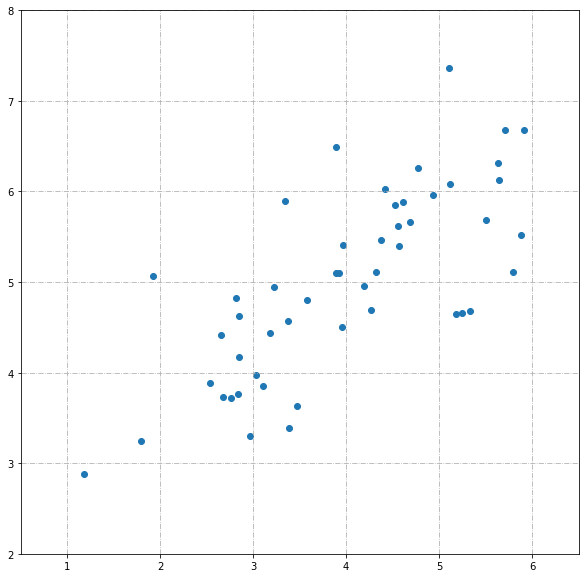

In [10]:
fig, ax = plt.subplots( figsize=(10,10) )
ax.grid(True, linestyle='-.')
ax.scatter(X[:,0], X[:,1], marker='o' )
ax.set_xlim([0.5, 6.5])
ax.set_ylim([2, 8])

# Part 2: Principal Component Analysis 

In [11]:
print('Running PCA on example dataset.')

Running PCA on example dataset.


In [21]:
def featureNormalize(X):
    
    mu = np.mean(X, axis=0 )

    X_norm =  X - mu

    sigma = np.std( X_norm,  axis=0, ddof=1 )

    X_norm = X_norm/ sigma

    return X_norm, mu, sigma

X_norm, mu, sigma = featureNormalize(X)

In [222]:
def pca( X ):

    m, n = np.shape(X)

    U = np.zeros([n])
    S = np.zeros([n])

    Sigma = 1 / m * np.dot(np.transpose(X), X)
    
    U,S,V = np.linalg.svd(Sigma)
    
    return U,S

U,S = pca(X_norm)

In [36]:
S

array([1.70081977, 0.25918023])

In [40]:
U[:,0]

array([-0.70710678, -0.70710678])

In [41]:
mu

array([3.98926528, 5.00280585])

(2, 8)

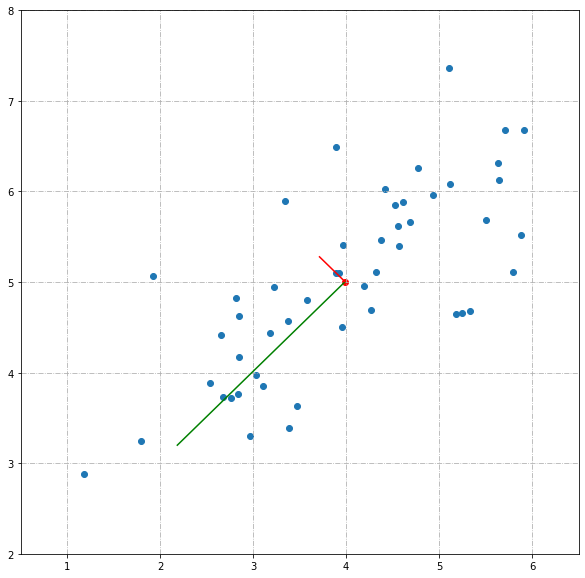

In [54]:
fig, ax = plt.subplots( figsize=(10,10) )
ax.grid(True, linestyle='-.')
ax.scatter(X[:,0], X[:,1], marker='o' )
ax.scatter(mu[0],mu[1],  marker='o', c='r' )

ax.plot( ( mu[0], mu[0] + ( 1.5 * S[0] *U[:,0])[0] ) , ( mu[1] , mu[1]+(1.5 * S[0] *U[:,0])[1] ), c='g' )   
ax.plot( ( mu[0], mu[0] + ( 1.5 * S[1] *U[:,1])[0] ) , ( mu[1] , mu[1]+(1.5 * S[1] *U[:,1])[1] ), c='r')   
ax.set_xlim([0.5, 6.5])
ax.set_ylim([2, 8])

In [57]:
print('Top eigenvector:')
print(f' U(:,1) = {U[0,0]:.6f} {U[1,0]:.6f}  ' )
print('(you should expect to see -0.707107 -0.707107)')

Top eigenvector:
 U(:,1) = -0.707107 -0.707107  
(you should expect to see -0.707107 -0.707107)


# Part 3: Dimension Reduction

In [ ]:
plot(X_norm(:, 1), X_norm(:, 2), 'bo')

(-4, 3)

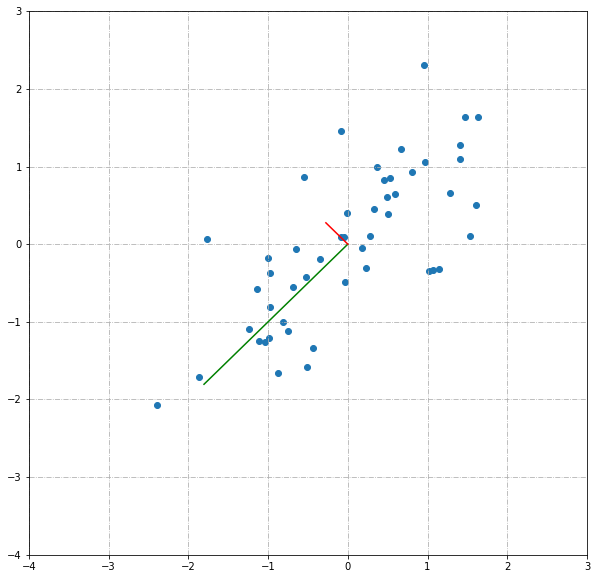

In [61]:
fig, ax = plt.subplots( figsize=(10,10) )
ax.grid(True, linestyle='-.')
ax.scatter(X_norm[:,0], X_norm[:,1], marker='o' )

ax.plot( ( 0,  ( 1.5 * S[0] *U[:,0])[0] ) , ( 0 , (1.5 * S[0] *U[:,0])[1] ), c='g' )   
ax.plot( ( 0,  ( 1.5 * S[1] *U[:,1])[0] ) , ( 0 , (1.5 * S[1] *U[:,1])[1] ), c='r')   
ax.set_xlim([-4, 3])
ax.set_ylim([-4, 3])

In [77]:
K = 0;

In [219]:
def projectData(X, U, K):

    Z =  (np.dot(X , U[:, :(K+1)]))
    return Z

def recoverData(Z, U, K):

    X_rec =  np.dot(Z, np.transpose(U[:, :(K+1)])  )

    return X_rec

In [220]:
Z = projectData(X_norm, U, K)

In [221]:
X_rec = recoverData(Z, U, K)


(-4, 3)

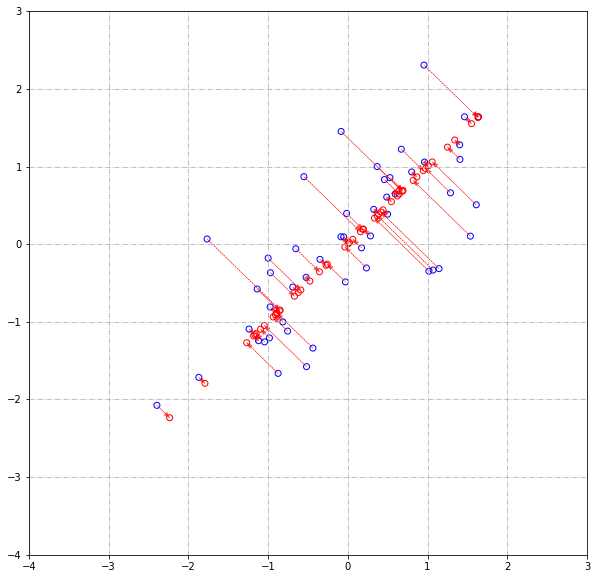

In [149]:
fig, ax = plt.subplots( figsize=(10,10) )
ax.grid(True, linestyle='-.')
ax.scatter(X_norm[:,0], X_norm[:,1], marker='o', facecolors='none',edgecolor="blue" )
ax.scatter(X_rec[:,0], X_rec[:,1], marker='o' , facecolors='none',edgecolor="red")
 
X_direction = X_rec- X_norm
for i in range(np.shape(X_norm)[0]):

    ax.arrow( X_norm[i,0], X_norm[i,1], X_direction[i,0] ,X_direction[i,1],
             head_width=0.05, linewidth =0.5 , length_includes_head=True, color='r',alpha = 0.7,linestyle ='--' ) 

ax.set_xlim([-4, 3])
ax.set_ylim([-4, 3])

# Part 4: Loading and Visualizing Face Data

In [142]:
data = sio.loadmat(file_name='ex7faces.mat')
X = data['X']

dict_keys(['__header__', '__version__', '__globals__', 'X'])

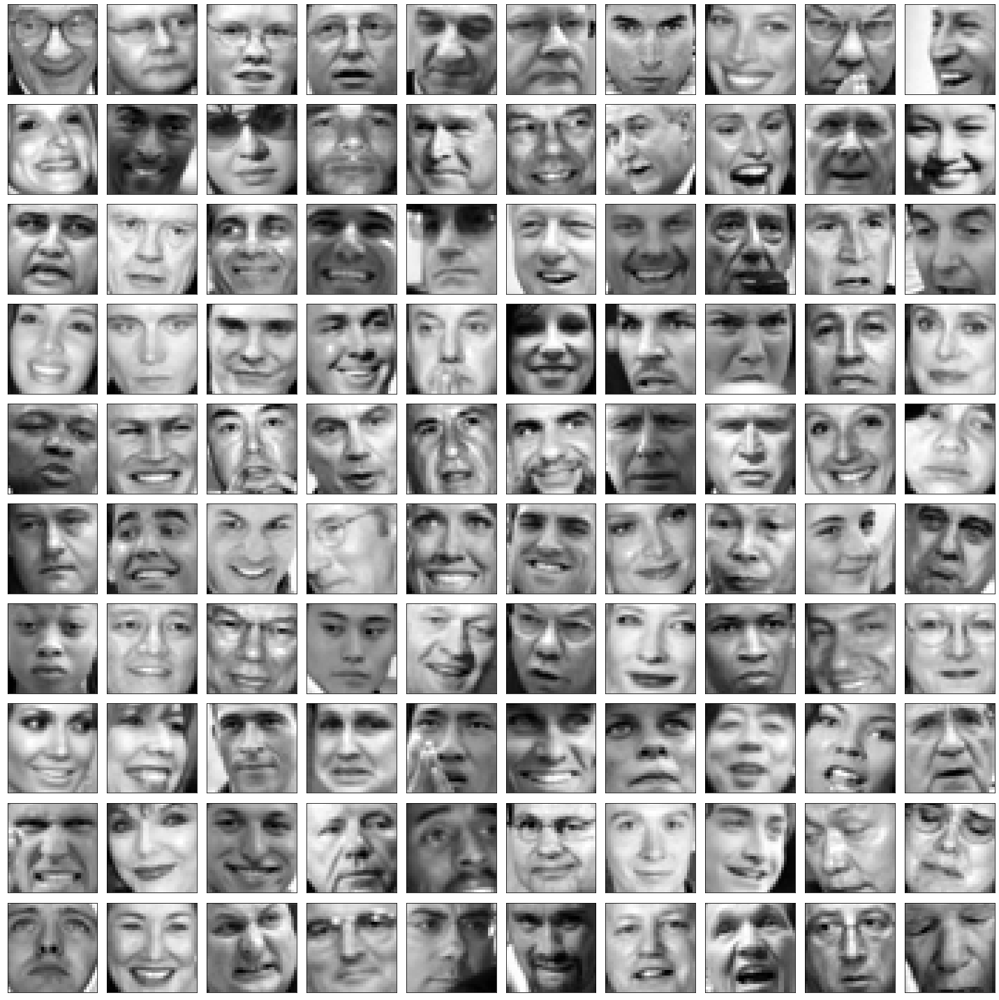

In [152]:
fig, axs = plt.subplots( figsize=(20,20), nrows=10, ncols=10, subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axs.flat):
    
    ax.imshow( np.transpose(np.reshape(X[i], [32,32] )), cmap='gist_gray' )

fig.tight_layout()

In [153]:
X_norm, mu, sigma = featureNormalize(X)

In [154]:
U,S = pca(X_norm)

[[-0.01425307 -0.03606596 -0.04561884 ...  0.00521903  0.00091143
   0.00077515]
 [-0.01474233 -0.03809858 -0.04756249 ... -0.01142763 -0.00228691
  -0.00434598]
 [-0.01501482 -0.03988747 -0.05082085 ...  0.01843345  0.00554132
   0.00873415]
 ...
 [-0.00895052  0.03119618 -0.05691806 ...  0.0011493   0.00452914
  -0.01218846]
 [-0.00769526  0.0290752  -0.05579144 ... -0.00103011 -0.00647834
   0.00752741]
 [-0.00692969  0.02725819 -0.05339471 ...  0.00266801  0.00543461
  -0.00218828]]
[3.36957617e+02 1.30912609e+02 5.46825930e+01 ... 2.36011191e-04
 2.16380954e-04 1.99377929e-04]
[[-0.01425307 -0.01474233 -0.01501482 ... -0.00895052 -0.00769526
  -0.00692969]
 [-0.03606596 -0.03809858 -0.03988747 ...  0.03119618  0.0290752
   0.02725819]
 [-0.04561884 -0.04756249 -0.05082085 ... -0.05691806 -0.05579144
  -0.05339471]
 ...
 [ 0.00521903 -0.01142763  0.01843345 ...  0.0011493  -0.00103011
   0.00266801]
 [ 0.00091143 -0.00228691  0.00554132 ...  0.00452914 -0.00647834
   0.00543461]
 [

In [155]:
np.shape(U)

(1024, 1024)

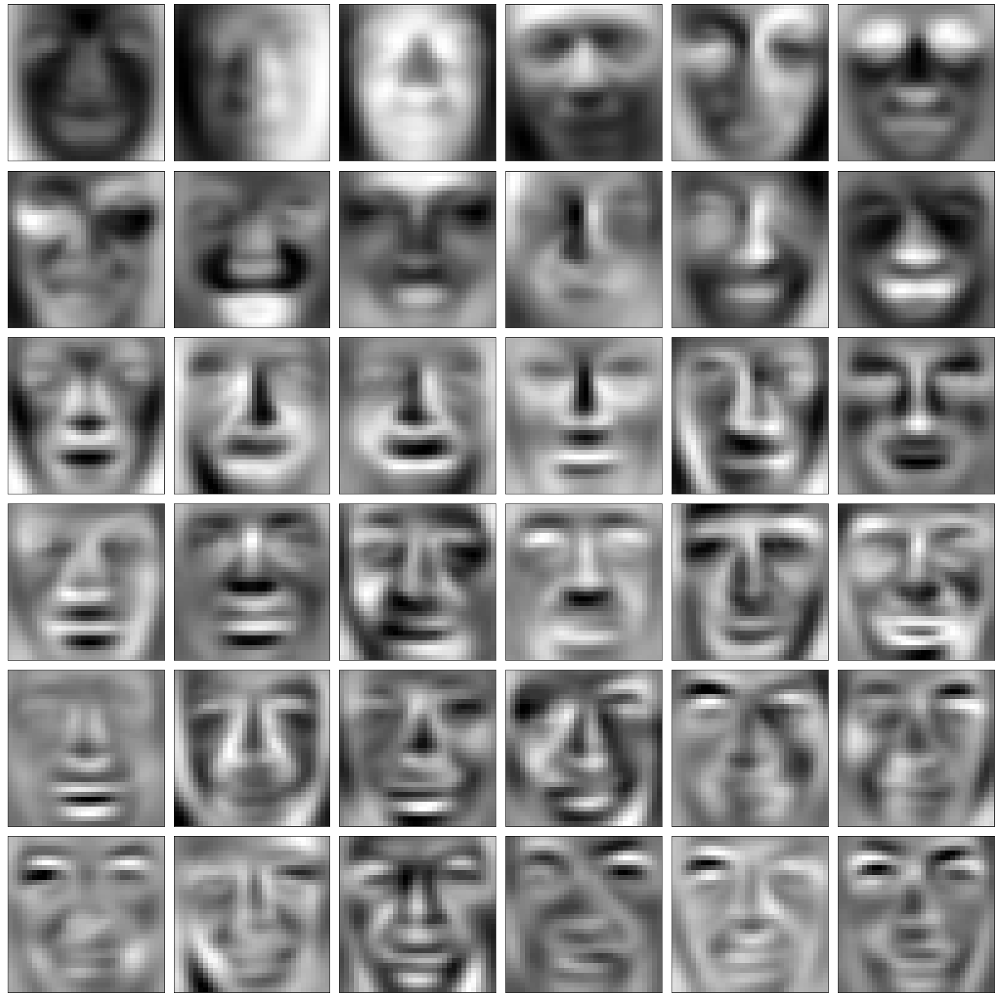

In [158]:
fig, axs = plt.subplots( figsize=(20,20), nrows=6, ncols=6, subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axs.flat):
    
    ax.imshow( np.transpose(np.reshape(np.transpose(U)[i], [32,32] )), cmap='gist_gray' )

fig.tight_layout()


# Part 6: Dimension Reduction for Faces

In [159]:
K = 100
Z = projectData(X_norm, U, K)

In [160]:
print('The projected data Z has a size of: ')
print( np.shape(Z) )

The projected data Z has a size of: 
(5000, 101)


# Part 7: Visualization of Faces after PCA Dimension Reduction 

In [161]:
K = 100;
X_rec  = recoverData(Z, U, K);

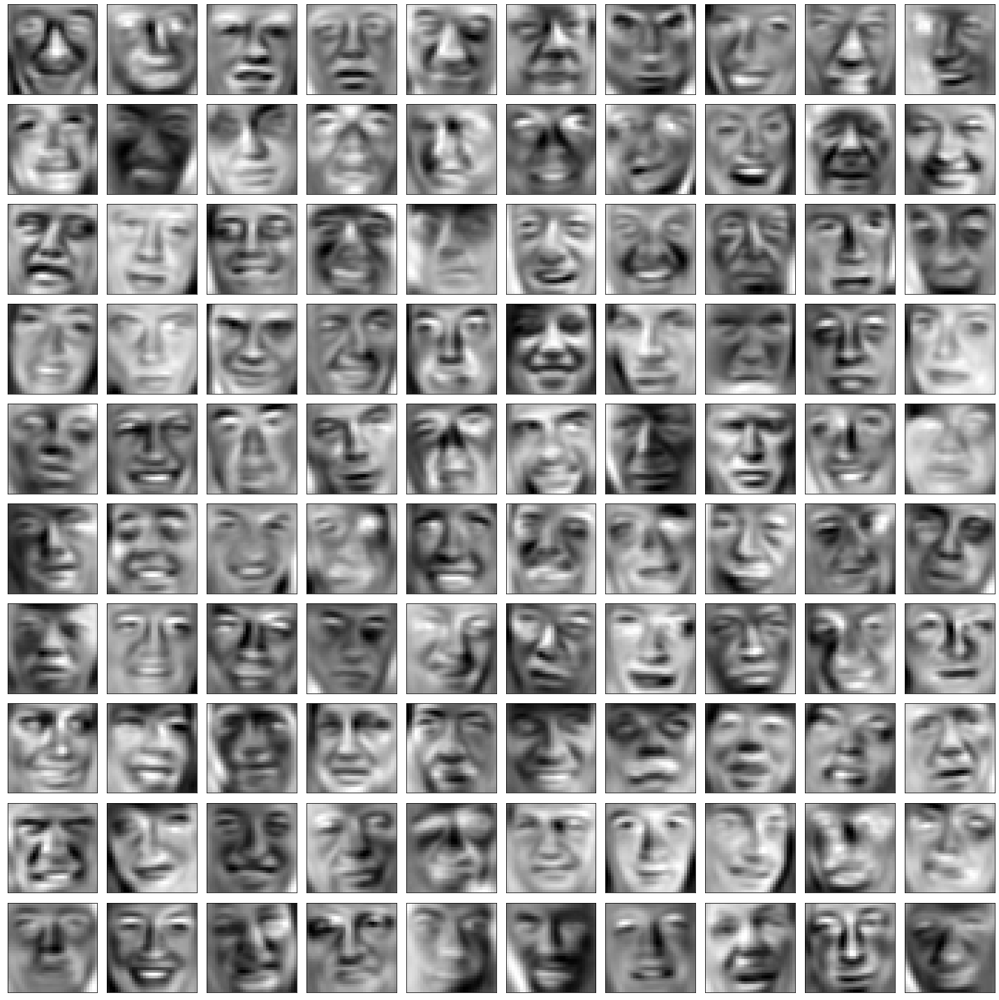

In [162]:
fig, axs = plt.subplots( figsize=(20,20), nrows=10, ncols=10, subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axs.flat):
    
    ax.imshow( np.transpose(np.reshape(X_rec[i], [32,32] )), cmap='gist_gray' )

fig.tight_layout()

# Part 8(a): Optional (ungraded) Exercise: PCA for Visualization

In [168]:
A = imread('bird_small.png')

In [170]:
img_size = np.shape(A)

In [171]:
X = np.reshape(A, [img_size[0] * img_size[1], 3])

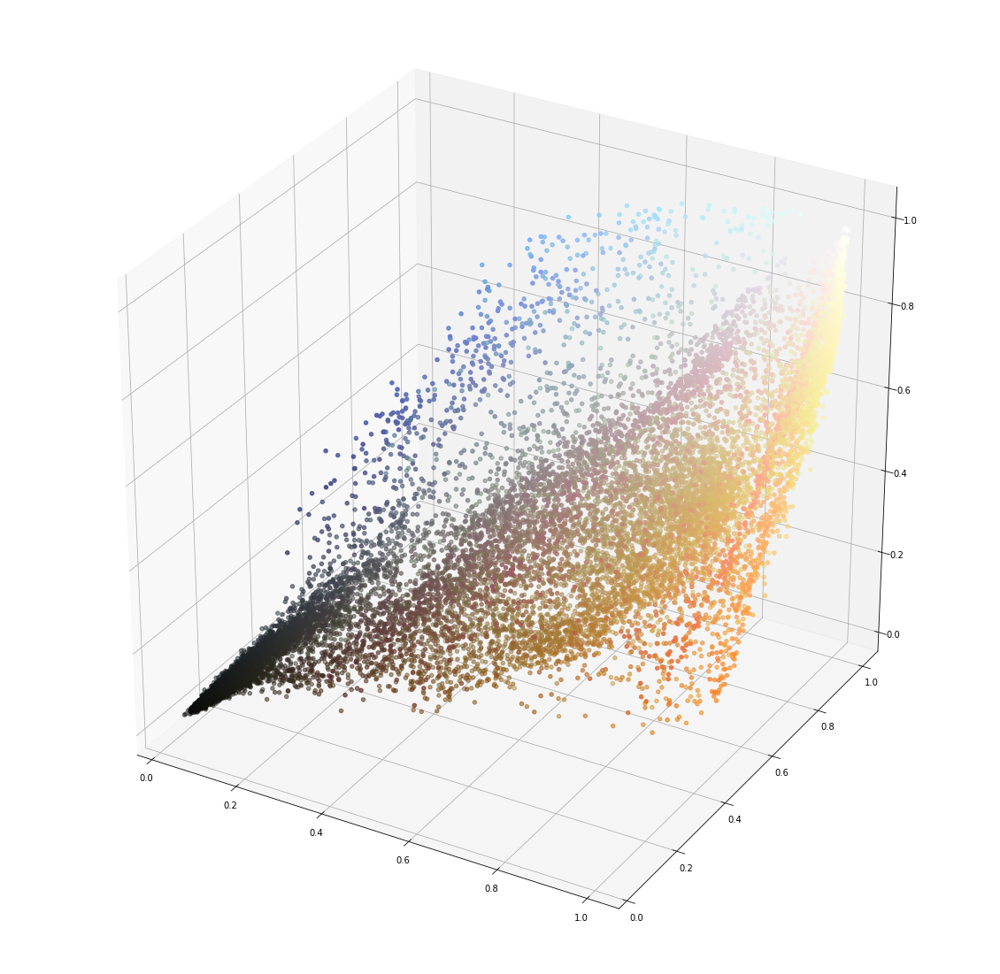

In [194]:
from mpl_toolkits.mplot3d import Axes3D 

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')

    
ax.scatter(X[:,0], X[:,1], X[:,2], marker='o', c=X)

In [172]:
K = 16
max_iters = 10

In [178]:
# import os
# import time 
# from IPython import display
# os.system("PAUSE")

def findClosestCentroids(X, centroids):

    K = np.shape(centroids)[0]    

    idx = np.zeros(np.shape(X)[0], dtype=np.int)

    # dist = np.zeros( np.shape(centroids)[0] )

    for i in range(np.shape(X)[0]):
        
        dist = np.sum((centroids- X[i])**2, axis=1)
        idx[i] = np.argmin(dist)

    return idx

def computeCentroids(X, idx, K):

    m, n = np.shape(X)

    centroid = np.zeros([K, n])

    for centroid_idx in range(K):

        pos = idx == centroid_idx
        centroids[centroid_idx,:] = np.sum( X[pos,:]/np.sum(pos) , axis=0)
    
    return centroids


def runkMeans(X, initial_centroids, max_iters, plot_progress = False):

    m, n = np.shape(X)
    K = np.shape(initial_centroids)[0]

    centroids = initial_centroids
    previous_centroids = []
    idx = np.zeros([m], dtype=np.int)

    for i in range(max_iters):
        print(f"Step nr: {i}")
        idx = findClosestCentroids(X, centroids)

        previous_centroids.append( centroids )

        if plot_progress:

            fig, ax = plt.subplots( figsize=(10,10) )

            ax.grid(True, linestyle='-.')
            
            colors = np.zeros([m,K])
            for j in range(m):
                colors[j,idx[j]] = 1

            ax.scatter(X[:,0], X[:,1], marker='o', c=colors  )
            ax.set_title(f'Iteration number {i}.')

            for j in range(len(previous_centroids)-1):
                for k in range(K):

                    ax.arrow( previous_centroids[j][k,0], previous_centroids[j][k,1] , previous_centroids[j+1][k,0]-previous_centroids[j][k,0], previous_centroids[j+1][k,1]-previous_centroids[j][k,1]  ,head_width=head_width, length_includes_head=True, color='k' )
            
            ax.scatter(centroids[:,0], centroids[:,1], marker='x',c=[[1,0,0],[0,1,0],[0,0,1] ]  )    




        centroids = computeCentroids(X, idx, K)  
        plt.show()


    return centroids, idx

In [179]:
def kMeansInitCentroids(X, K):

    randidx = np.random.permutation(np.shape(X)[0])
    centroids = X[randidx[:K]]

    return centroids

initial_centroids = kMeansInitCentroids(X, K)

In [180]:
centroids, idx = runkMeans(X, initial_centroids, max_iters)

Step nr: 0
Step nr: 1
Step nr: 2
Step nr: 3
Step nr: 4
Step nr: 5
Step nr: 6
Step nr: 7
Step nr: 8
Step nr: 9


In [197]:
colors = np.zeros_like(X)
for i in range(np.shape(centroids)[0]):
    mask_idx = idx == i
    colors[mask_idx]  = centroids[i]

In [214]:
sel = np.random.permutation(np.shape(X)[0])[:1000]

In [215]:
np.shape(X)

(16384, 3)

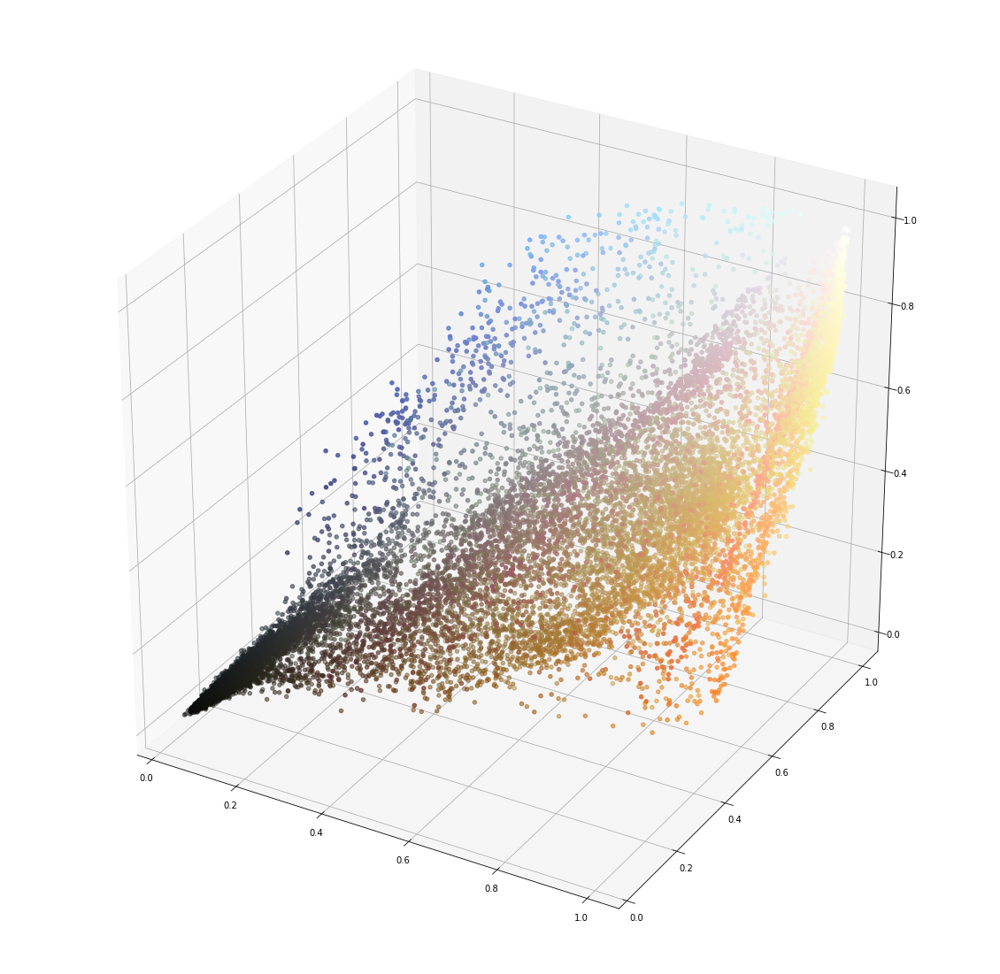

In [216]:
from mpl_toolkits.mplot3d import Axes3D 

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')

    
ax.scatter(X[:,0], X[:,1], X[:,2], marker='o', c=X)


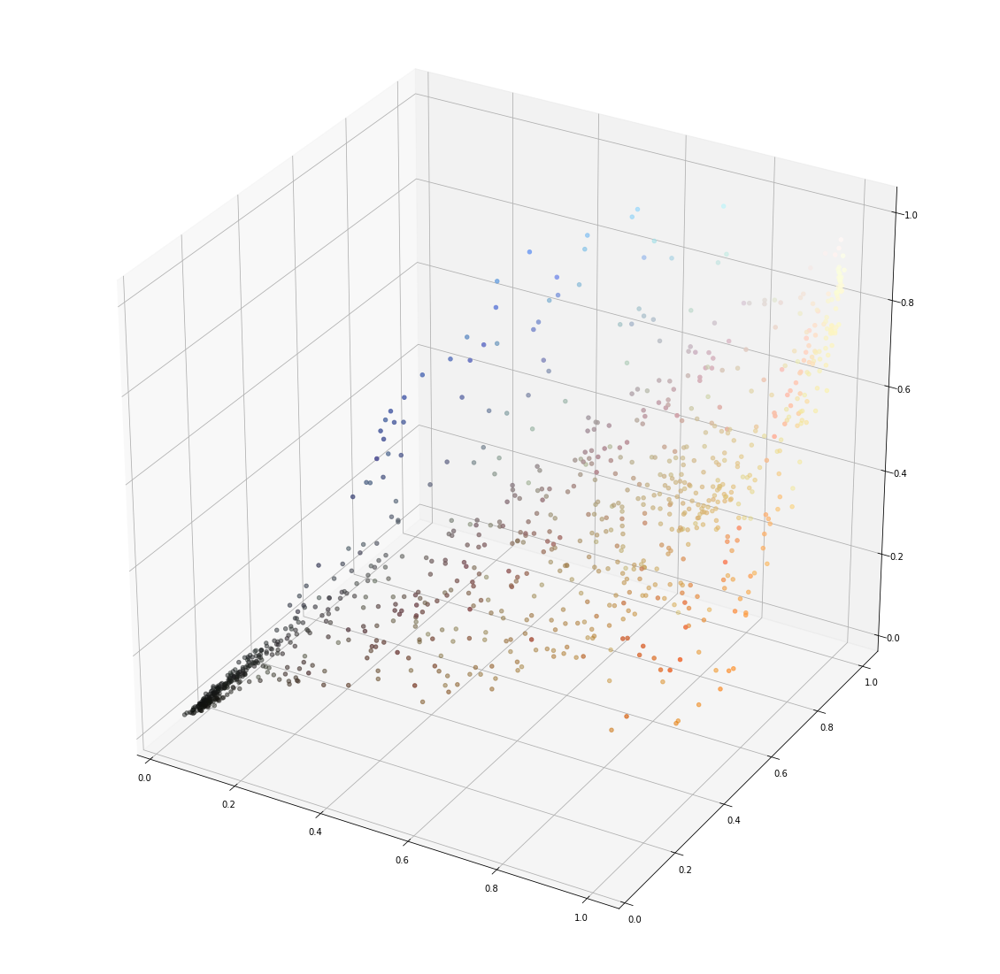

In [217]:
from mpl_toolkits.mplot3d import Axes3D 

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
    
ax.scatter(X[sel,0], X[sel,1], X[sel,2], marker='o', c=X[sel])


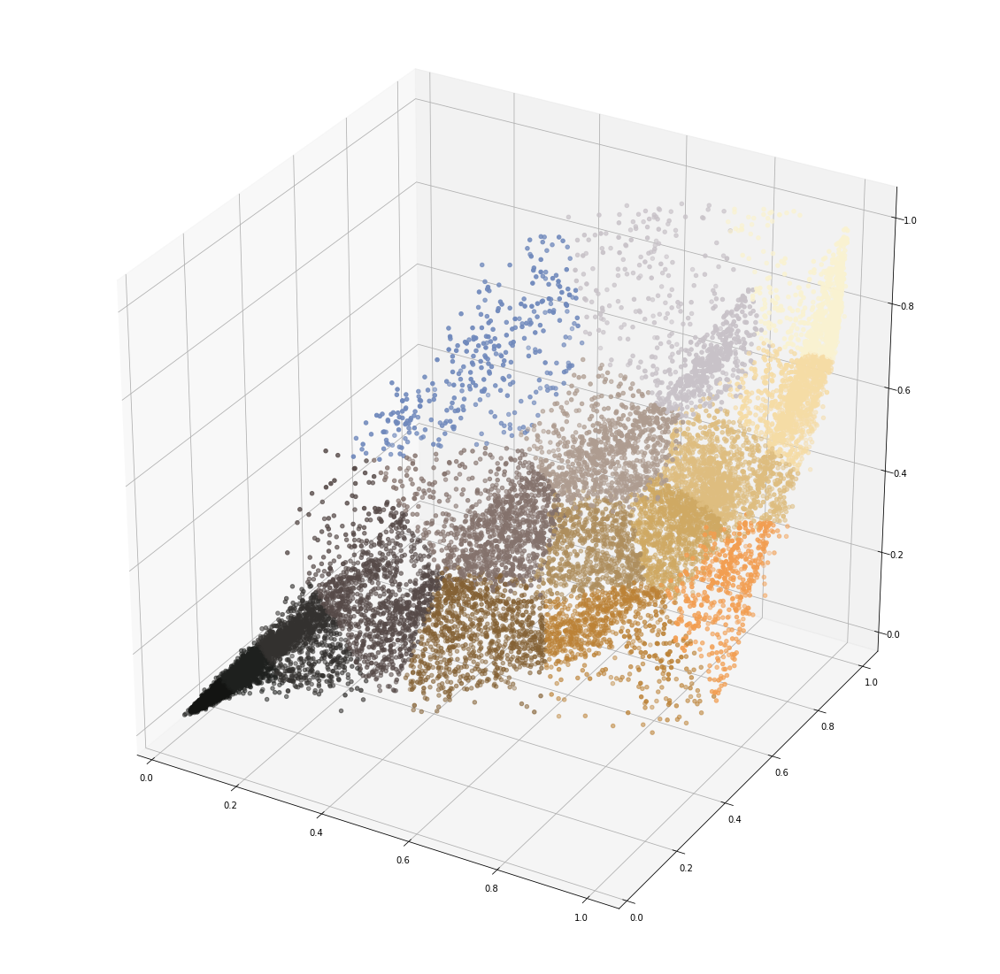

In [198]:
from mpl_toolkits.mplot3d import Axes3D 

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')

    
ax.scatter(X[:,0], X[:,1], X[:,2], marker='o', c=colors)

In [199]:
X_norm, mu, sigma = featureNormalize(X);

In [200]:
U, S = pca(X_norm);
Z = projectData(X_norm, U, 2);

[[-0.5754359   0.60054797  0.5551717 ]
 [-0.5986462   0.15320615 -0.7862255 ]
 [-0.5572219  -0.7847738   0.27135548]]
[2.7403793  0.2396922  0.01974773]
[[-0.5754359  -0.5986462  -0.5572219 ]
 [ 0.60054797  0.15320615 -0.7847738 ]
 [ 0.5551717  -0.7862255   0.27135548]]


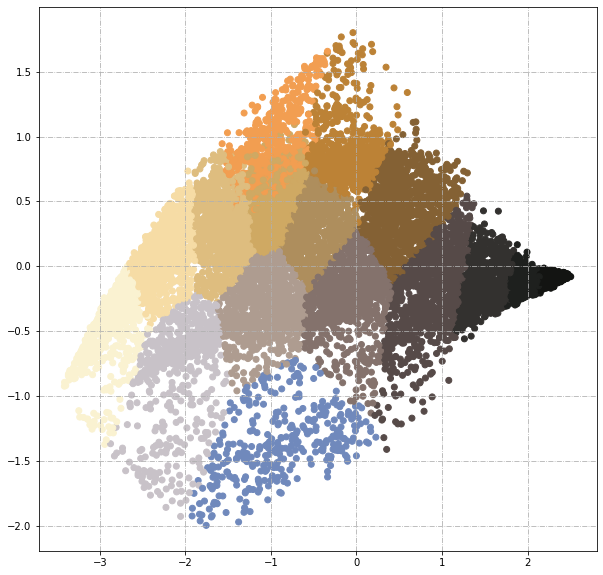

In [201]:
fig, ax = plt.subplots( figsize=(10,10) )

ax.grid(True, linestyle='-.')

ax.scatter(Z[:,0], Z[:,1], marker='o', c=colors  )

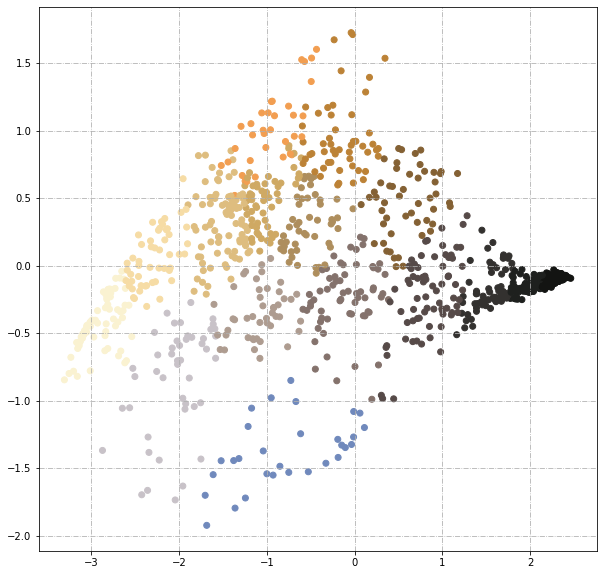

In [218]:
fig, ax = plt.subplots( figsize=(10,10) )

ax.grid(True, linestyle='-.')

ax.scatter(Z[sel,0], Z[sel,1], marker='o', c=colors[sel]  )